In [2]:
import os
import glob
import copy
from collections import defaultdict
import random
from abc import ABC, abstractmethod
import importlib
import functools
import time
import random


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.transforms as transforms
import torch
import torch.nn as nn
from torch.nn import init
from torch.optim import lr_scheduler
from torch.utils.data import Dataset,DataLoader
import cv2 as cv
import imagesize
import torchvision.transforms as T
from PIL import Image
from joblib import Parallel, delayed
from tqdm.auto import tqdm

import utils
from dataset import TrashDataset

from vae_v2 import init_net, init_weights
from vae_v2.aae import AAE
from vae_v2.dataset import TrashDataset
from vae_v2.data import CustomDatasetDataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2



In [3]:
%load_ext autoreload
%autoreload 2

### Opts

In [4]:
class Opt:
    data_dir: str = "../student_db"
    channels:int = 3
    img_size: int = 256
    gpu: list[int] = [0]
    model: str = "aae"
    save_dir: str = "vae_v2_saved_models/aae"
    latent: int = 100
    init_type: str = "normal" # [normal | xavier | kaiming | orthogonal]
    init_gain: float = 0.02
    cropsize: int = 256
    verbose:bool=False

    # train options
    print_epoch_freq: int = 1
    save_epoch_freq: int = 20
    epoch_count: int = 0
    n_epochs: int = 180
    n_epochs_decay: int = 61
    beta1: float = 0.5
    beta2: float = 0.999
    lr: float = 0.00002
    lr_policy: str = "linear" # [linear | step | plateau | cosine]
    lr_decay_iters: int = 50
    batch_size: int = 256
    mode: str = "train"
    num_threads:int = 10
    no_dropout: bool = True
    rotate: bool = True
    brightness:float=  0.1
    object:str = "notrash"

    means = (0.5, 0.5, 0.5) # (0.485, 0.456, 0.406)
    stds = (0.5, 0.5, 0.5)  # (0.229, 0.224, 0.225)

opt = Opt()

In [5]:
def get_transform(opt):
    """Transforms images"""
    transform = []
    if opt.rotate == True:
        transform.append(T.RandomRotation(0.5))
    transform.append(T.ColorJitter(brightness=opt.brightness))
    transform.append(T.Resize((opt.cropsize, opt.cropsize), interpolation=2))
    transform.append(T.ToTensor())
    if opt.channels == 3:
        transform.append(T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)))
    elif opt.channels == 1:
        transform.append(T.Normalize((0.5), (0.5)))

    return T.Compose(transform)

In [6]:
def get_test_transform(opt):
    """Transforms images"""
    transform = []

    transform.append(T.Resize((opt.cropsize, opt.cropsize), interpolation=2))
    transform.append(T.ToTensor())
    if opt.channels == 3:
        transform.append(T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)))
    elif opt.channels == 1:
        transform.append(T.Normalize((0.5), (0.5)))

    return T.Compose(transform)

In [5]:
def get_train_transform_v1(opt):
    """Transforms images"""
    train_transform = A.Compose(
        [
            # A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
            # A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(),
            A.HueSaturationValue(),
            A.Resize(height=256, width=256, interpolation=2),
            # A.RandomBrightnessContrast(p=0.5),
            A.Normalize(mean=opt.means, std=opt.stds),
            ToTensorV2(),
        ]
    )
    # train_transform = A.Compose(
    #     [
    #         A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
    #         A.HorizontalFlip(p=0.5),
    #         A.Resize(height=256, width=256),
    #         A.RandomBrightnessContrast(p=0.5),
    #         A.Normalize(mean=opt.means, std=opt.stds),
    #         ToTensorV2(),
    #     ]
    # )
    return train_transform

def get_test_transform_v1(opt):
    """Transforms images"""

    test_transform = A.Compose(
        [
            A.Resize(height=256, width=256),
            A.Normalize(mean=opt.means, std=opt.stds),
            ToTensorV2(),
        ]
    )
    
    return test_transform

In [58]:
%reload_ext autoreload

dataset = TrashDataset("../student_db", transform=get_transform(opt), train=True, grayscale=False, subset=True)
dataset_size = len(dataset)
# data_loader = CustomDatasetDataLoader(opt, dataset)
# dataset = data_loader.load_data()
print(f"Training size is = {dataset_size}")

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 416 tasks      | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done 1816 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 3216 tasks      | elapsed:    1.2s
[Parallel(n_jobs=8)]: Done 5016 tasks      | elapsed:    2.1s
[Parallel(n_jobs=8)]: Done 6816 tasks      | elapsed:    2.6s
[Parallel(n_jobs=8)]: Done 9016 tasks      | elapsed:    3.3s
[Parallel(n_jobs=8)]: Done 11216 tasks      | elapsed:    3.9s
[Parallel(n_jobs=8)]: Done 13237 tasks      | elapsed:    4.7s
[Parallel(n_jobs=8)]: Done 13521 tasks      | elapsed:    4.8s
[Parallel(n_jobs=8)]: Done 13626 tasks      | elapsed:    4.9s
[Parallel(n_jobs=8)]: Done 14310 tasks      | elapsed:    4.9s
[Parallel(n_jobs=8)]: Done 14622 tasks      | elapsed:    5.0s
[Parallel(n_jobs=8)]: Done 14741 tasks      | elapsed:    5.0s


Training size is = 15000


[Parallel(n_jobs=8)]: Done 15000 out of 15000 | elapsed:    5.2s finished


In [7]:
def visualize_augmentations(dataset, idx=0, samples=10, cols=5):
    dataset = copy.deepcopy(dataset)
    dataset.transform = A.Compose([t for t in dataset.transform if not isinstance(t, (A.Normalize, ToTensorV2))])
    rows = samples // cols
    figure, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 6))
    for i in range(samples):
        image = dataset[idx]["img"]
        ax.ravel()[i].imshow(image)
        ax.ravel()[i].set_axis_off()
    plt.tight_layout()
    plt.show()

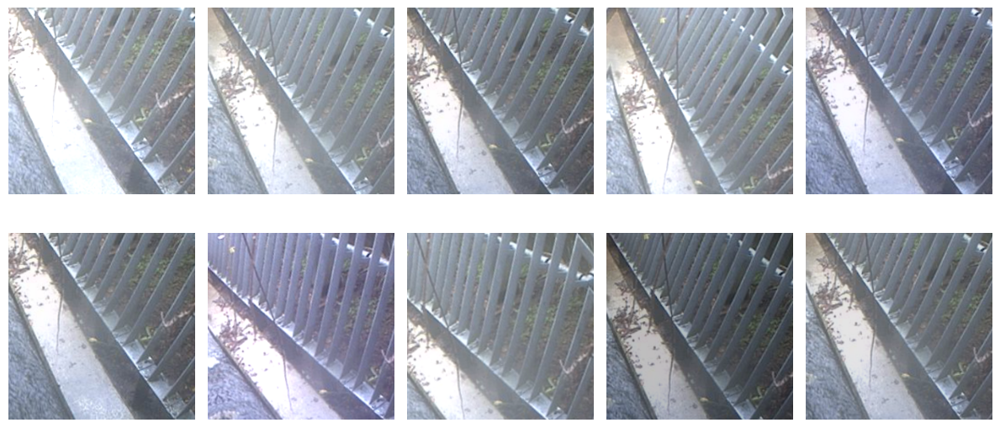

In [24]:
visualize_augmentations(dataset)

In [59]:
data_loader = CustomDatasetDataLoader(opt, dataset)
dataset_loaded = data_loader.load_data()


initialize network with normal
initialize network with normal
initialize network with normal
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------
0 : learning rate 0.0000200 -> 0.0000200


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:139: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


epoch : 0 | total_iters : 58 | epoch_time:11.555 | recon_loss:12.20063591003418 | dm_loss:1.2541067600250244 | g_loss:0.8666564226150513
saving the latest model (epoch 0, total_iters 58)
encoder saved in:  vae_v2_saved_models/aae/notrash/aae_e_0.pth
decoder saved in:  vae_v2_saved_models/aae/notrash/aae_d_0.pth


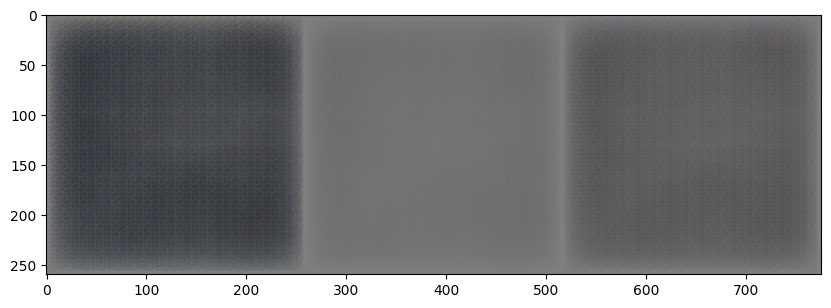

1 : learning rate 0.0000200 -> 0.0000200
epoch : 1 | total_iters : 116 | epoch_time:11.437 | recon_loss:9.564695358276367 | dm_loss:1.262969970703125 | g_loss:0.8420834541320801
2 : learning rate 0.0000200 -> 0.0000200
epoch : 2 | total_iters : 174 | epoch_time:11.418 | recon_loss:8.291996002197266 | dm_loss:1.224787712097168 | g_loss:0.894039511680603
3 : learning rate 0.0000200 -> 0.0000200
epoch : 3 | total_iters : 232 | epoch_time:11.445 | recon_loss:8.602472305297852 | dm_loss:1.174804449081421 | g_loss:0.9706979393959045
4 : learning rate 0.0000200 -> 0.0000200
epoch : 4 | total_iters : 290 | epoch_time:11.423 | recon_loss:7.51003360748291 | dm_loss:1.1339218616485596 | g_loss:1.0371475219726562
5 : learning rate 0.0000200 -> 0.0000200
epoch : 5 | total_iters : 348 | epoch_time:11.497 | recon_loss:7.238181114196777 | dm_loss:1.054192066192627 | g_loss:1.2097203731536865
6 : learning rate 0.0000200 -> 0.0000200
epoch : 6 | total_iters : 406 | epoch_time:11.482 | recon_loss:7.50218

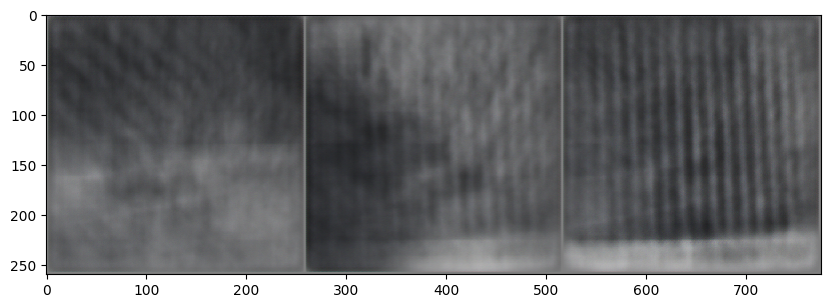

21 : learning rate 0.0000200 -> 0.0000200
epoch : 21 | total_iters : 1276 | epoch_time:11.553 | recon_loss:5.689149856567383 | dm_loss:0.7184672951698303 | g_loss:3.4234933853149414
22 : learning rate 0.0000200 -> 0.0000200
epoch : 22 | total_iters : 1334 | epoch_time:11.608 | recon_loss:5.533597946166992 | dm_loss:0.7184298038482666 | g_loss:3.505385637283325
23 : learning rate 0.0000200 -> 0.0000200
epoch : 23 | total_iters : 1392 | epoch_time:11.605 | recon_loss:5.63594913482666 | dm_loss:0.7079682350158691 | g_loss:3.6693966388702393
24 : learning rate 0.0000200 -> 0.0000200
epoch : 24 | total_iters : 1450 | epoch_time:11.551 | recon_loss:5.4604949951171875 | dm_loss:0.706520140171051 | g_loss:3.806938648223877
25 : learning rate 0.0000200 -> 0.0000200
epoch : 25 | total_iters : 1508 | epoch_time:11.465 | recon_loss:5.536688804626465 | dm_loss:0.7026472687721252 | g_loss:3.963043451309204
26 : learning rate 0.0000200 -> 0.0000200
epoch : 26 | total_iters : 1566 | epoch_time:11.441 

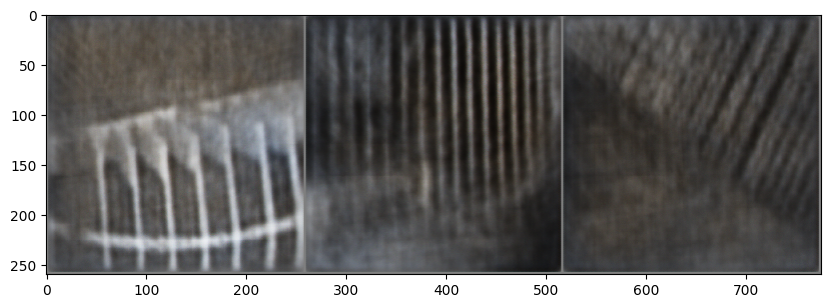

41 : learning rate 0.0000200 -> 0.0000200
epoch : 41 | total_iters : 2436 | epoch_time:11.559 | recon_loss:4.760341167449951 | dm_loss:0.6829999685287476 | g_loss:5.449881076812744
42 : learning rate 0.0000200 -> 0.0000200
epoch : 42 | total_iters : 2494 | epoch_time:11.664 | recon_loss:4.63353967666626 | dm_loss:0.6813458204269409 | g_loss:5.511133193969727
43 : learning rate 0.0000200 -> 0.0000200
epoch : 43 | total_iters : 2552 | epoch_time:11.619 | recon_loss:4.569209575653076 | dm_loss:0.6776856780052185 | g_loss:5.613221168518066
44 : learning rate 0.0000200 -> 0.0000200
epoch : 44 | total_iters : 2610 | epoch_time:11.684 | recon_loss:4.67017936706543 | dm_loss:0.6746878623962402 | g_loss:5.557183265686035
45 : learning rate 0.0000200 -> 0.0000200
epoch : 45 | total_iters : 2668 | epoch_time:11.590 | recon_loss:4.465177059173584 | dm_loss:0.6782753467559814 | g_loss:5.705915451049805
46 : learning rate 0.0000200 -> 0.0000200
epoch : 46 | total_iters : 2726 | epoch_time:11.615 | r

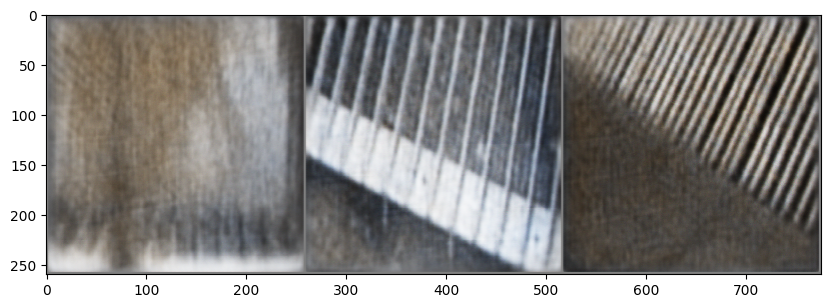

61 : learning rate 0.0000200 -> 0.0000200
epoch : 61 | total_iters : 3596 | epoch_time:11.615 | recon_loss:4.074187755584717 | dm_loss:0.6714920401573181 | g_loss:6.819244384765625
62 : learning rate 0.0000200 -> 0.0000200
epoch : 62 | total_iters : 3654 | epoch_time:11.633 | recon_loss:3.92429256439209 | dm_loss:0.6642613410949707 | g_loss:6.9137067794799805
63 : learning rate 0.0000200 -> 0.0000200
epoch : 63 | total_iters : 3712 | epoch_time:11.640 | recon_loss:3.93538236618042 | dm_loss:0.6638111472129822 | g_loss:6.895653247833252
64 : learning rate 0.0000200 -> 0.0000200
epoch : 64 | total_iters : 3770 | epoch_time:11.528 | recon_loss:3.954359769821167 | dm_loss:0.6707094311714172 | g_loss:6.882031440734863
65 : learning rate 0.0000200 -> 0.0000200
epoch : 65 | total_iters : 3828 | epoch_time:11.606 | recon_loss:4.081050872802734 | dm_loss:0.6654773354530334 | g_loss:7.066324234008789
66 : learning rate 0.0000200 -> 0.0000200
epoch : 66 | total_iters : 3886 | epoch_time:11.578 | 

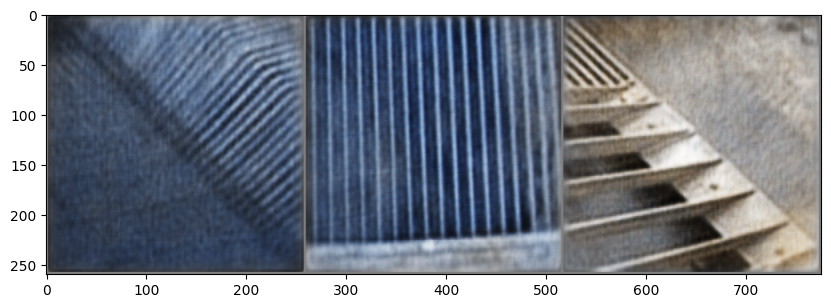

81 : learning rate 0.0000200 -> 0.0000200
epoch : 81 | total_iters : 4756 | epoch_time:11.592 | recon_loss:3.6347718238830566 | dm_loss:0.6648887991905212 | g_loss:7.956734657287598
82 : learning rate 0.0000200 -> 0.0000200
epoch : 82 | total_iters : 4814 | epoch_time:11.640 | recon_loss:3.5005042552948 | dm_loss:0.6656321883201599 | g_loss:7.88278865814209
83 : learning rate 0.0000200 -> 0.0000200
epoch : 83 | total_iters : 4872 | epoch_time:11.608 | recon_loss:3.4867961406707764 | dm_loss:0.6504310965538025 | g_loss:7.881913661956787
84 : learning rate 0.0000200 -> 0.0000200
epoch : 84 | total_iters : 4930 | epoch_time:11.596 | recon_loss:3.8168561458587646 | dm_loss:0.6560261845588684 | g_loss:8.179899215698242
85 : learning rate 0.0000200 -> 0.0000200
epoch : 85 | total_iters : 4988 | epoch_time:11.617 | recon_loss:3.5960917472839355 | dm_loss:0.6569505333900452 | g_loss:7.966429710388184
86 : learning rate 0.0000200 -> 0.0000200
epoch : 86 | total_iters : 5046 | epoch_time:11.590 

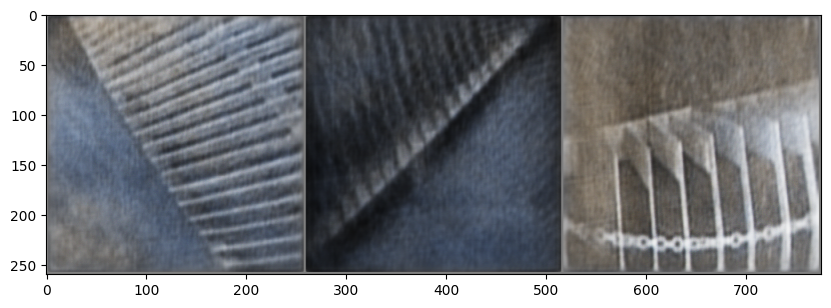

101 : learning rate 0.0000200 -> 0.0000200
epoch : 101 | total_iters : 5916 | epoch_time:11.562 | recon_loss:3.3570799827575684 | dm_loss:0.6478678584098816 | g_loss:8.932473182678223
102 : learning rate 0.0000200 -> 0.0000200
epoch : 102 | total_iters : 5974 | epoch_time:11.650 | recon_loss:3.4911060333251953 | dm_loss:0.6478974223136902 | g_loss:8.822542190551758
103 : learning rate 0.0000200 -> 0.0000200
epoch : 103 | total_iters : 6032 | epoch_time:11.723 | recon_loss:3.376950740814209 | dm_loss:0.64411461353302 | g_loss:9.18939208984375
104 : learning rate 0.0000200 -> 0.0000200
epoch : 104 | total_iters : 6090 | epoch_time:11.661 | recon_loss:3.302541494369507 | dm_loss:0.6468716263771057 | g_loss:9.042879104614258
105 : learning rate 0.0000200 -> 0.0000200
epoch : 105 | total_iters : 6148 | epoch_time:11.635 | recon_loss:3.3302600383758545 | dm_loss:0.6373792290687561 | g_loss:9.119998931884766
106 : learning rate 0.0000200 -> 0.0000200
epoch : 106 | total_iters : 6206 | epoch_t

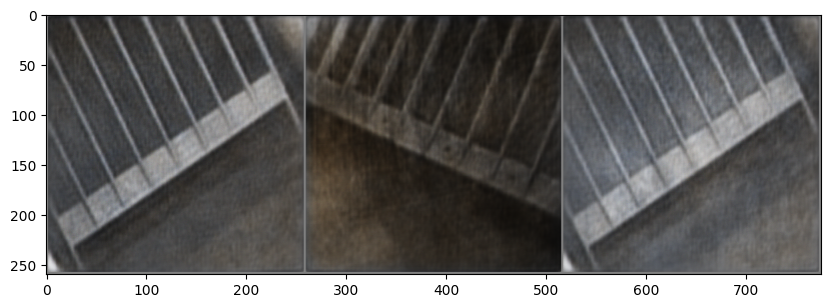

121 : learning rate 0.0000200 -> 0.0000200
epoch : 121 | total_iters : 7076 | epoch_time:11.573 | recon_loss:3.022536039352417 | dm_loss:0.6340722441673279 | g_loss:9.743922233581543
122 : learning rate 0.0000200 -> 0.0000200
epoch : 122 | total_iters : 7134 | epoch_time:11.667 | recon_loss:3.203212261199951 | dm_loss:0.6396151185035706 | g_loss:9.808263778686523
123 : learning rate 0.0000200 -> 0.0000200
epoch : 123 | total_iters : 7192 | epoch_time:11.592 | recon_loss:3.2848098278045654 | dm_loss:0.6305603981018066 | g_loss:9.84528923034668
124 : learning rate 0.0000200 -> 0.0000200
epoch : 124 | total_iters : 7250 | epoch_time:11.515 | recon_loss:3.1846117973327637 | dm_loss:0.6325183510780334 | g_loss:9.876256942749023
125 : learning rate 0.0000200 -> 0.0000200
epoch : 125 | total_iters : 7308 | epoch_time:11.554 | recon_loss:3.177182674407959 | dm_loss:0.6292234063148499 | g_loss:9.91135311126709
126 : learning rate 0.0000200 -> 0.0000200
epoch : 126 | total_iters : 7366 | epoch_t

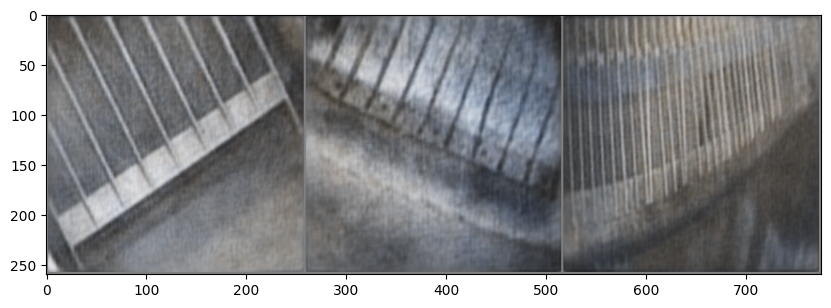

141 : learning rate 0.0000200 -> 0.0000200
epoch : 141 | total_iters : 8236 | epoch_time:11.616 | recon_loss:3.067457914352417 | dm_loss:0.6240690350532532 | g_loss:10.093311309814453
142 : learning rate 0.0000200 -> 0.0000200
epoch : 142 | total_iters : 8294 | epoch_time:11.593 | recon_loss:3.1515321731567383 | dm_loss:0.624415397644043 | g_loss:10.290563583374023
143 : learning rate 0.0000200 -> 0.0000200
epoch : 143 | total_iters : 8352 | epoch_time:11.521 | recon_loss:3.0546271800994873 | dm_loss:0.6129065752029419 | g_loss:10.321792602539062
144 : learning rate 0.0000200 -> 0.0000200
epoch : 144 | total_iters : 8410 | epoch_time:11.491 | recon_loss:3.2046375274658203 | dm_loss:0.6146672368049622 | g_loss:10.387752532958984
145 : learning rate 0.0000200 -> 0.0000200
epoch : 145 | total_iters : 8468 | epoch_time:11.587 | recon_loss:3.130580425262451 | dm_loss:0.6157379746437073 | g_loss:10.299093246459961
146 : learning rate 0.0000200 -> 0.0000200
epoch : 146 | total_iters : 8526 | 

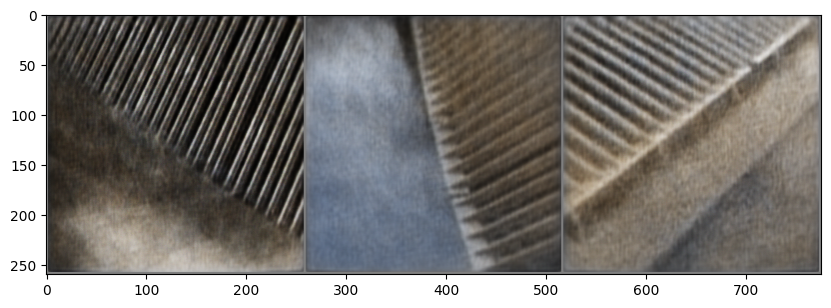

161 : learning rate 0.0000200 -> 0.0000200
epoch : 161 | total_iters : 9396 | epoch_time:11.700 | recon_loss:3.1070308685302734 | dm_loss:0.5964292883872986 | g_loss:10.406070709228516
162 : learning rate 0.0000200 -> 0.0000200
epoch : 162 | total_iters : 9454 | epoch_time:11.687 | recon_loss:2.9833788871765137 | dm_loss:0.6053037047386169 | g_loss:10.411111831665039
163 : learning rate 0.0000200 -> 0.0000200
epoch : 163 | total_iters : 9512 | epoch_time:11.664 | recon_loss:2.650243043899536 | dm_loss:0.6057754158973694 | g_loss:10.514018058776855
164 : learning rate 0.0000200 -> 0.0000200
epoch : 164 | total_iters : 9570 | epoch_time:11.640 | recon_loss:2.9739463329315186 | dm_loss:0.5954029560089111 | g_loss:10.344950675964355
165 : learning rate 0.0000200 -> 0.0000200
epoch : 165 | total_iters : 9628 | epoch_time:11.666 | recon_loss:2.926556348800659 | dm_loss:0.591615617275238 | g_loss:10.307826042175293
166 : learning rate 0.0000200 -> 0.0000200
epoch : 166 | total_iters : 9686 | 

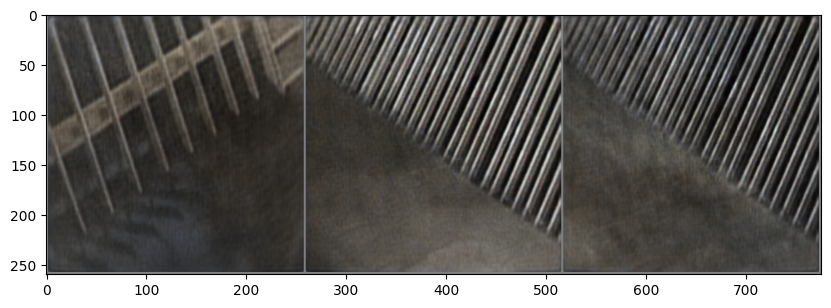

181 : learning rate 0.0000197 -> 0.0000193
epoch : 181 | total_iters : 10556 | epoch_time:11.611 | recon_loss:2.838125228881836 | dm_loss:0.579379141330719 | g_loss:10.47951889038086
182 : learning rate 0.0000193 -> 0.0000190
epoch : 182 | total_iters : 10614 | epoch_time:11.636 | recon_loss:2.8029963970184326 | dm_loss:0.5778577327728271 | g_loss:10.434619903564453
183 : learning rate 0.0000190 -> 0.0000187
epoch : 183 | total_iters : 10672 | epoch_time:11.645 | recon_loss:2.83905029296875 | dm_loss:0.5692620873451233 | g_loss:10.563010215759277
184 : learning rate 0.0000187 -> 0.0000184
epoch : 184 | total_iters : 10730 | epoch_time:11.627 | recon_loss:2.8823695182800293 | dm_loss:0.5734506845474243 | g_loss:10.372810363769531
185 : learning rate 0.0000184 -> 0.0000180
epoch : 185 | total_iters : 10788 | epoch_time:11.555 | recon_loss:2.906472682952881 | dm_loss:0.5750800967216492 | g_loss:10.63044548034668
186 : learning rate 0.0000180 -> 0.0000177
epoch : 186 | total_iters : 10846 

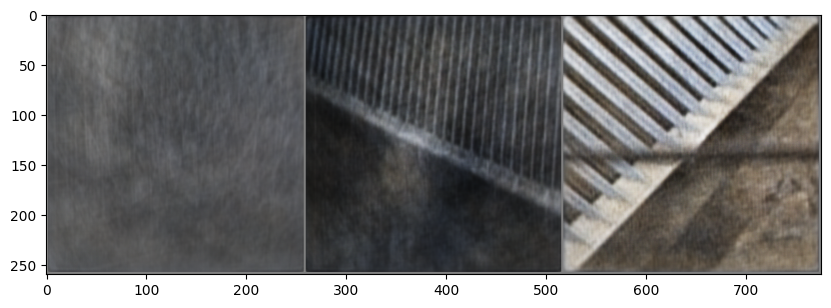

201 : learning rate 0.0000131 -> 0.0000128
epoch : 201 | total_iters : 11716 | epoch_time:11.684 | recon_loss:2.712808132171631 | dm_loss:0.5614287257194519 | g_loss:10.494253158569336
202 : learning rate 0.0000128 -> 0.0000125
epoch : 202 | total_iters : 11774 | epoch_time:11.730 | recon_loss:2.799592971801758 | dm_loss:0.5568979978561401 | g_loss:10.574974060058594
203 : learning rate 0.0000125 -> 0.0000121
epoch : 203 | total_iters : 11832 | epoch_time:11.701 | recon_loss:2.921630382537842 | dm_loss:0.5620290040969849 | g_loss:10.720436096191406
204 : learning rate 0.0000121 -> 0.0000118
epoch : 204 | total_iters : 11890 | epoch_time:11.703 | recon_loss:2.8793883323669434 | dm_loss:0.5546102523803711 | g_loss:10.810259819030762
205 : learning rate 0.0000118 -> 0.0000115
epoch : 205 | total_iters : 11948 | epoch_time:11.660 | recon_loss:2.7302920818328857 | dm_loss:0.5499427914619446 | g_loss:10.852863311767578
206 : learning rate 0.0000115 -> 0.0000111
epoch : 206 | total_iters : 12

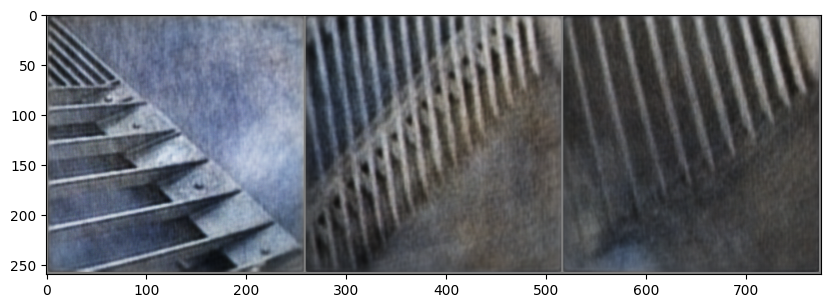

221 : learning rate 0.0000066 -> 0.0000062
epoch : 221 | total_iters : 12876 | epoch_time:11.653 | recon_loss:2.6823878288269043 | dm_loss:0.5452648997306824 | g_loss:11.052431106567383
222 : learning rate 0.0000062 -> 0.0000059
epoch : 222 | total_iters : 12934 | epoch_time:11.648 | recon_loss:2.7458903789520264 | dm_loss:0.5497241616249084 | g_loss:11.029338836669922
223 : learning rate 0.0000059 -> 0.0000056
epoch : 223 | total_iters : 12992 | epoch_time:11.738 | recon_loss:2.788938045501709 | dm_loss:0.544246256351471 | g_loss:11.055803298950195
224 : learning rate 0.0000056 -> 0.0000052
epoch : 224 | total_iters : 13050 | epoch_time:11.641 | recon_loss:2.6995906829833984 | dm_loss:0.5552324056625366 | g_loss:11.005820274353027
225 : learning rate 0.0000052 -> 0.0000049
epoch : 225 | total_iters : 13108 | epoch_time:11.693 | recon_loss:2.721459150314331 | dm_loss:0.5482538938522339 | g_loss:11.034404754638672
226 : learning rate 0.0000049 -> 0.0000046
epoch : 226 | total_iters : 13

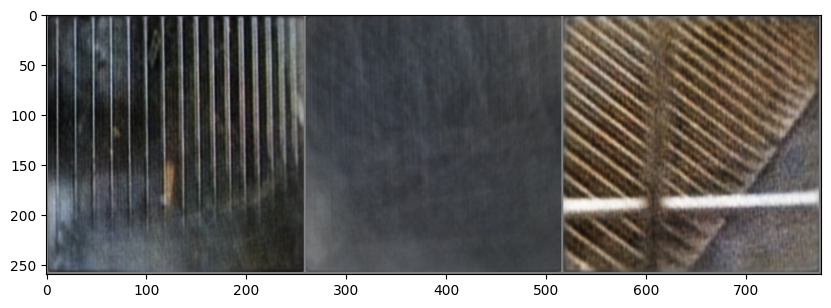

241 : learning rate 0.0000000 -> -0.0000003
epoch : 241 | total_iters : 14036 | epoch_time:11.530 | recon_loss:88.4627685546875 | dm_loss:0.5447412133216858 | g_loss:11.178850173950195
encoder saved in:  vae_v2_saved_models/aae/notrash/aae_e_241.pth
decoder saved in:  vae_v2_saved_models/aae/notrash/aae_d_241.pth


In [7]:

opt.mode="train"

all_losses = defaultdict(list)

model = AAE(opt)       # create model (AE, AAE)
model.setup(opt)   
total_iters = 0
loss_name = model.loss_name            # loss name for naming 



for epoch in range(opt.epoch_count, opt.n_epochs + opt.n_epochs_decay + 1):
    epoch_start_time = time.time()                      # start epoch time
    model.update_learning_rate(epoch)                   # update learning rate change with schedulers
    epoch_iters = 0

    for i, data in enumerate(dataset_loaded):                  # dataset loop
        iter_start_time = time.time()                   # start iter time
        model.set_input(data)                           # unpacking input data for processing
        model.train()                                   # start model train
        total_iters += 1
        epoch_iters += 1
    if epoch % opt.print_epoch_freq == 0:               # model loss, time print frequency
        losses = model.get_current_losses(*loss_name)
        epoch_time = time.time() - epoch_start_time
        message = f"epoch : {epoch} | total_iters : {total_iters} | epoch_time:{epoch_time:.3f}"
        for k,v in losses.items():
            message += f" | {k}:{v}"
            all_losses[k].append(v)
        print(message)
    if epoch % opt.save_epoch_freq == 0:                # save model frequency
        print(
            "saving the latest model (epoch %d, total_iters %d)"
            % (epoch, total_iters)
        )
        model.save_networks(epoch)
        utils.plt_show(model.generated_imgs[:3], opt.means, opt.stds)
model.save_networks(epoch)

In [8]:
import pickle
with open('train_losse_s_v2_1.pkl', 'wb') as f:  # Python 3: open(..., 'wb')
    pickle.dump(all_losses, f)

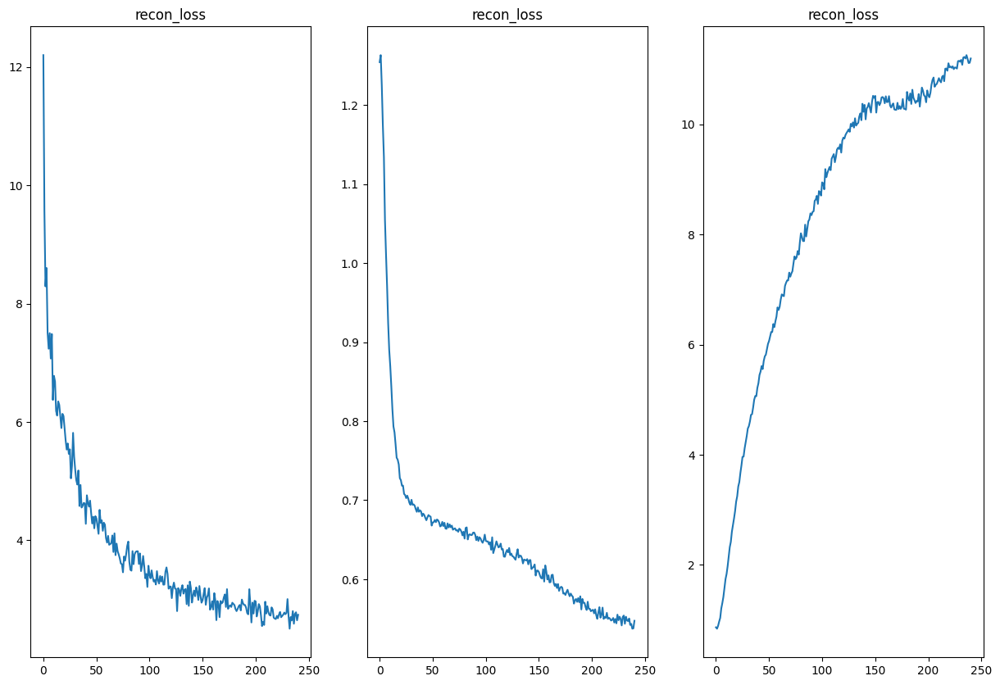

In [9]:
fig, axes = plt.subplots(1,3, figsize=(15,10))
axes[0].plot(range(len(all_losses["recon_loss"])-1), all_losses["recon_loss"][:-1])
axes[0].set_title("recon_loss")
axes[1].plot(range(len(all_losses["dm_loss"])-1), all_losses["dm_loss"][:-1])
axes[1].set_title("recon_loss")
axes[2].plot(range(len(all_losses["g_loss"])-1), all_losses["g_loss"][:-1])
axes[2].set_title("recon_loss")
plt.show()

In [8]:
opt.verbose=True
opt.mode="test"
opt.threshold = 0.4    # get test options
opt.batch_size = 1
opt.trained_encoder_name = "aae_e_220.pth"
opt.trained_decoder_name = "aae_d_220.pth"

test_dataset = TrashDataset("../student_db", transform=get_test_transform(opt), train=False, grayscale=False, subset=True)
test_dataset_size = len(test_dataset)
test_data_loader = CustomDatasetDataLoader(opt, test_dataset)
test_dataset_loaded = test_data_loader.load_data()
print(f"Training size is = {test_dataset_size}")

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 142 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 240 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 366 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 492 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 646 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 800 tasks      | elapsed:    0.2s


Training size is = 1200


[Parallel(n_jobs=8)]: Done 982 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 1200 out of 1200 | elapsed:    0.3s finished


### Compare prediction with real on test data

loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_220.pth
---------- Networks initialized -------------
DataParallel(
  (module): Encoder_aae(
    (model): Sequential(
      (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
      (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (5): LeakyReLU(negative_slope=0.2, inplace=True)
      (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (7): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (8): LeakyReLU(negative_slope=0.2, inplace=True)
      (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), paddin

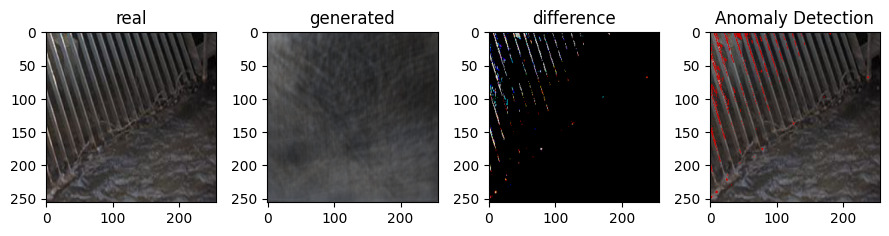

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0001_0281.png


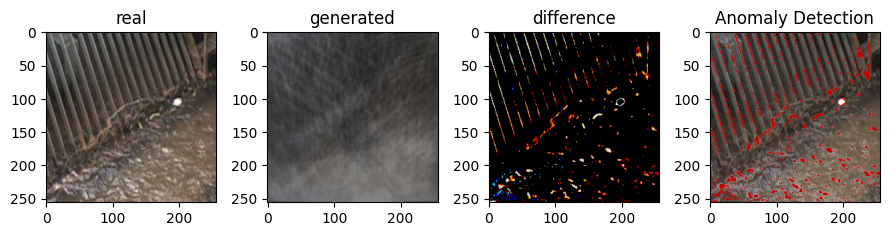

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0001_0072.png


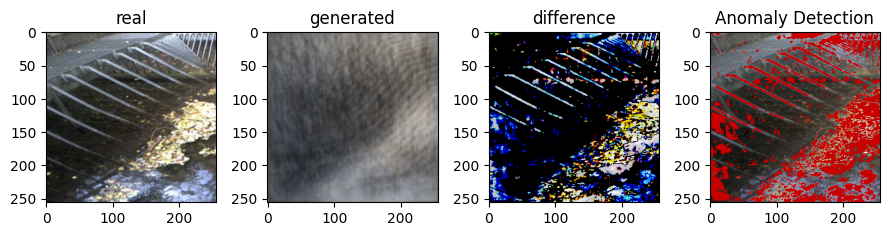

image_paths:  vae_v2_saved_models/aae/notrash/result/trash0003_0208.png


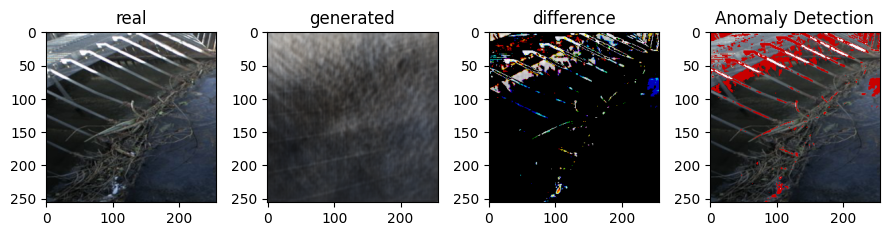

image_paths:  vae_v2_saved_models/aae/notrash/result/trash0003_0023.png


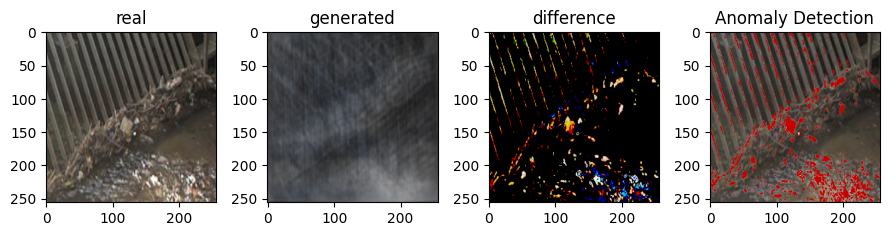

image_paths:  vae_v2_saved_models/aae/notrash/result/trash0001_0335.png


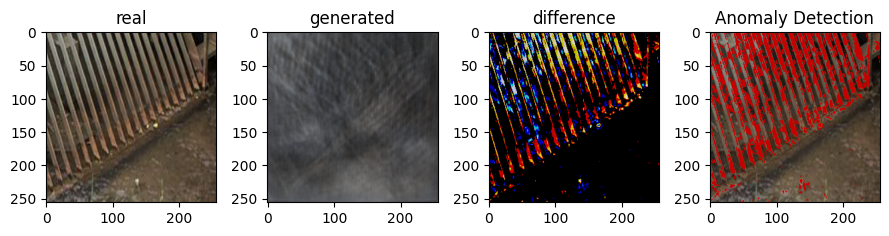

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0001_0593.png


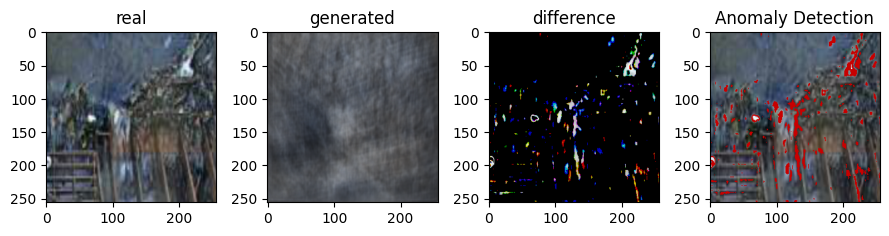

image_paths:  vae_v2_saved_models/aae/notrash/result/trash0002_0320.png


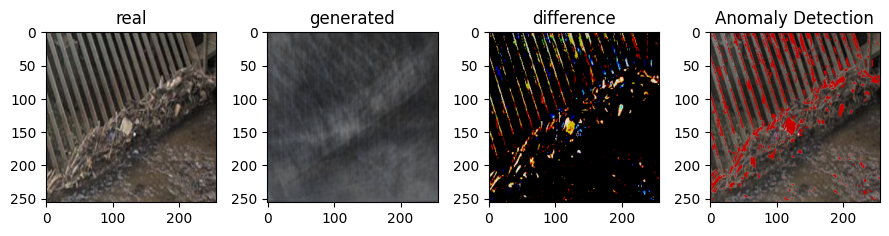

image_paths:  vae_v2_saved_models/aae/notrash/result/trash0001_0385.png


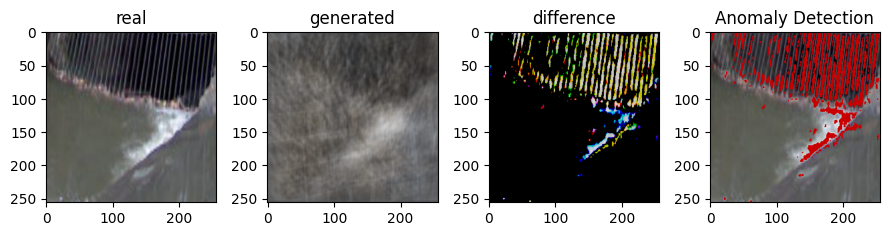

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0004_0697.png


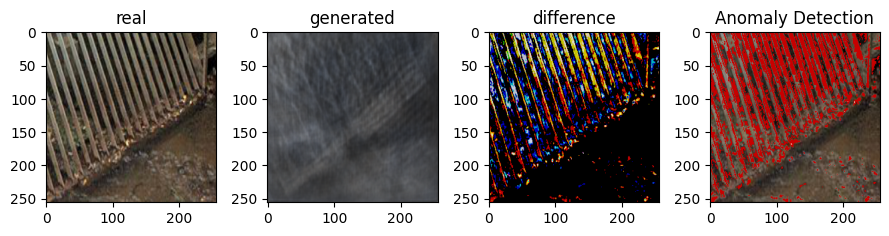

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0001_0654.png


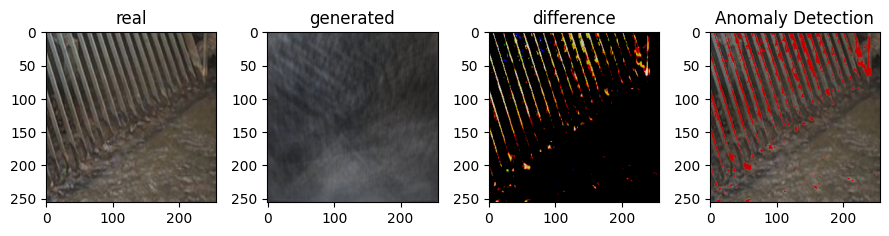

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0001_0736.png
end Test


In [17]:

model = AAE(opt)       # create model (AE, AAE)
model.setup(opt)                # set model : if mode is 'train', define schedulers and if mode is 'test', load saved networks
model.eval()                    # model eval version
for i, data in enumerate(test_data_loader):

    epoch_start_time = time.time()
    model.set_input(data)
    model.test()

    generated_images = model.get_generated_imags()
    epoch_time = time.time() - epoch_start_time
    # print(f"{i} epoch_time : {epoch_time:.3f}")
    
    model.save_images(data)
    if i == 10:
        break
print("end Test")

### Compare prediction and real on validation dataset

loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_220.pth
---------- Networks initialized -------------
DataParallel(
  (module): Encoder_aae(
    (model): Sequential(
      (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
      (3): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (5): LeakyReLU(negative_slope=0.2, inplace=True)
      (6): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (7): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (8): LeakyReLU(negative_slope=0.2, inplace=True)
      (9): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), paddin

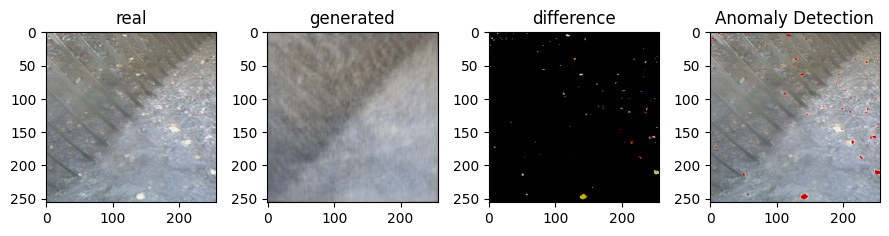

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0003_0150.png


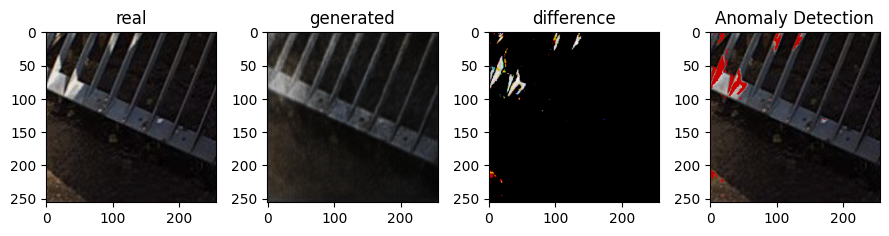

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0006_0655.png


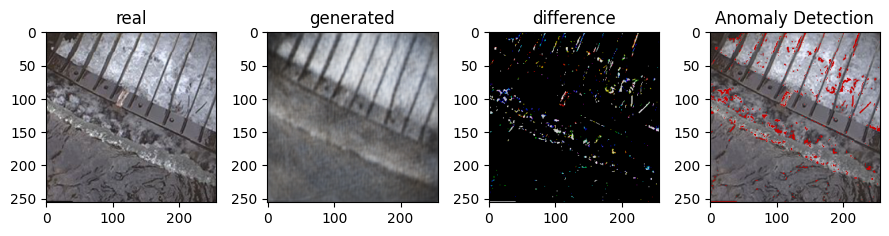

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0014_0048.png


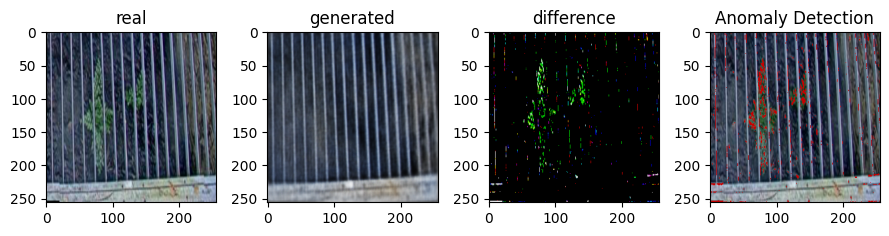

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0021_0916.png


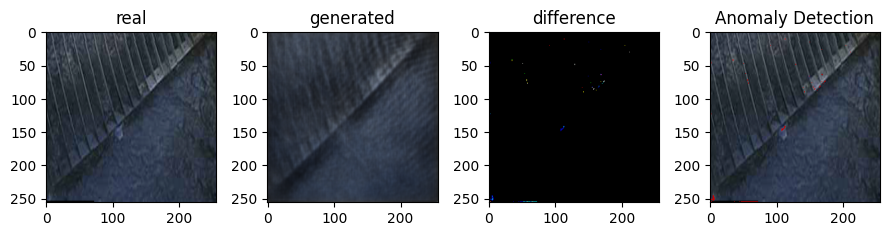

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0020_0160.png


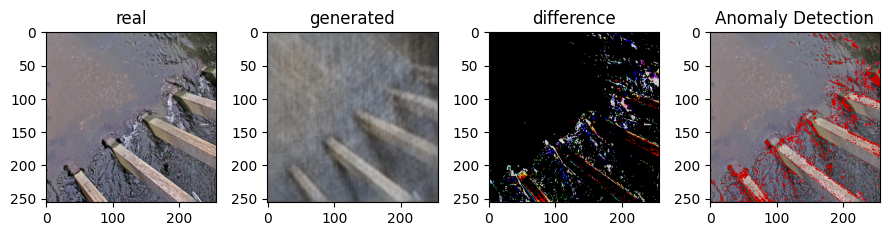

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0007_1626.png


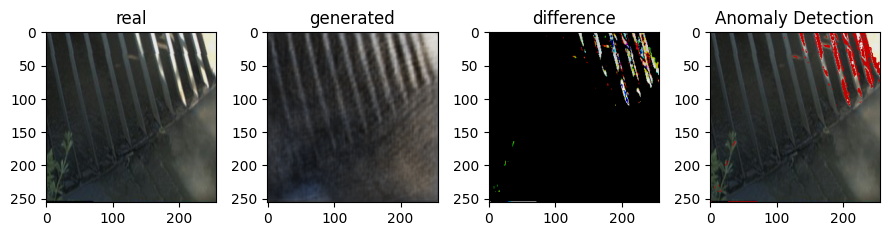

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0043_0573.png


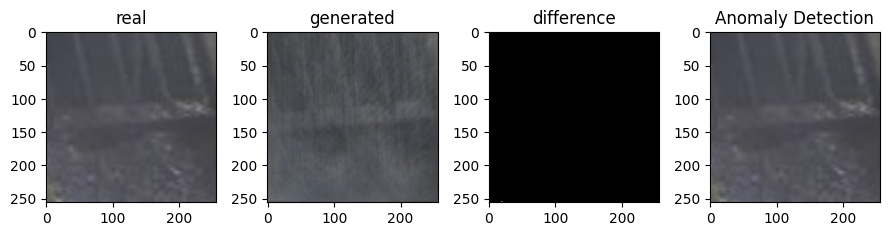

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0005_1453.png


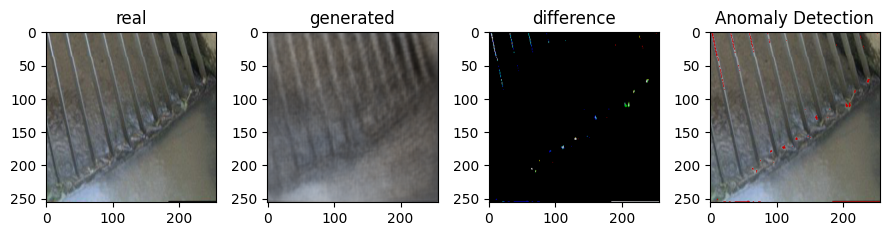

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0043_0307.png


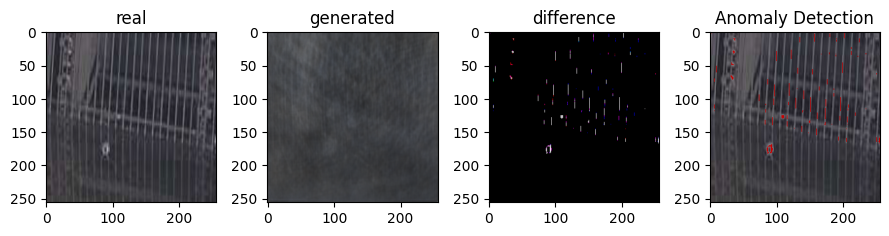

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0039_0570.png


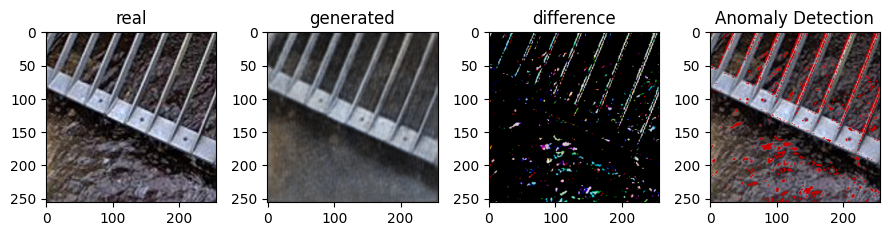

image_paths:  vae_v2_saved_models/aae/notrash/result/notrash0006_0398.png
end Test


In [19]:
opt.batch_size = 1
valid_data_loader = CustomDatasetDataLoader(opt, dataset)
valid_dataset_loaded = valid_data_loader.load_data()

model = AAE(opt)       # create model (AE, AAE)
model.setup(opt)                # set model : if mode is 'train', define schedulers and if mode is 'test', load saved networks
model.eval()                    # model eval version
for i, data in enumerate(valid_dataset_loaded):


    epoch_start_time = time.time()
    model.set_input(data)
    model.test()

    generated_images = model.get_generated_imags()
    epoch_time = time.time() - epoch_start_time
    # print(f"{i} epoch_time : {epoch_time:.3f}")
    
    model.save_images(data)
    if i == 10:
        break
print("end Test")

In [28]:
print("Running Test")
opt.mode="test"
opt.threshold = 0.2    # get test options
opt.batch_size = 1

test_dataset = TrashDataset("../student_db", transform=get_transform(opt), train=False, grayscale=False, subset=False)
test_dataset_size = len(test_dataset)
test_data_loader = CustomDatasetDataLoader(opt, test_dataset)
test_dataset_loaded = test_data_loader.load_data()

Running Test


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 416 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 1816 tasks      | elapsed:    0.6s
[Parallel(n_jobs=8)]: Done 2286 tasks      | elapsed:    0.6s
[Parallel(n_jobs=8)]: Done 2598 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done 2910 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done 3064 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done 3218 tasks      | elapsed:    0.8s
[Parallel(n_jobs=8)]: Done 3400 tasks      | elapsed:    0.8s
[Parallel(n_jobs=8)]: Done 3954 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 4400 out of 4400 | elapsed:    1.0s finished


In [33]:

def evaluate(dataset, ignorance_threshold, opt):
    opt.verbose = False

    all_actual_predictions = {}
    all_diffs = {}
    saved_epochs = [240, 220,200,180,160,140,120,100,80,60,40,20] 
    for epoch in saved_epochs:
        opt.trained_encoder_name = f"aae_e_{epoch}.pth"
        opt.trained_decoder_name = f"aae_d_{epoch}.pth"

        predictions = []
        actual = []

        all_diffs_per_epoch = defaultdict(list)
        model = AAE(opt)       # create model (AE, AAE)
        model.setup(opt)                # set model : if mode is 'train', define schedulers and if mode is 'test', load saved networks
        model.eval()                    # model eval version
        for i, data in enumerate(dataset):
            epoch_start_time = time.time()
            model.set_input(data)
            model.test()

            generated_images = model.get_generated_imags()
            epoch_time = time.time() - epoch_start_time


            diff_img = np.abs(data["img"][0].numpy() - generated_images[0].cpu().numpy())
            diff_img[diff_img < ignorance_threshold*0.5+0.5] = 0
            diff = np.sum(diff_img)

            if diff < 2500:
                predictions.append("notrash")
            else:
                predictions.append("trash")
            # print(data["path"])
            if "notrash"in data["path"][0]:
                actual.append("notrash")
            else:
                actual.append("trash")
            

            all_diffs_per_epoch["notrash" if "notrash"in data["path"][0] else "trash"].append(diff)
            # model.save_images(data)
        
        all_actual_predictions[epoch] = (actual, predictions)
        all_diffs[epoch] = all_diffs_per_epoch

    return all_diffs,all_actual_predictions

#### Calculate loss with 0.2 ignorance threshold

In [49]:
all_diffs_1,all_actual_predictions_1 = evaluate(test_dataset_loaded, 0.2, opt)


loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_240.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_240.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_220.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_200.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_200.pth
---------- Networks initialized --------

Mean of trash losses 3311.9292
Mean of No trash losses 2221.9128
Diff of means 1090.0164


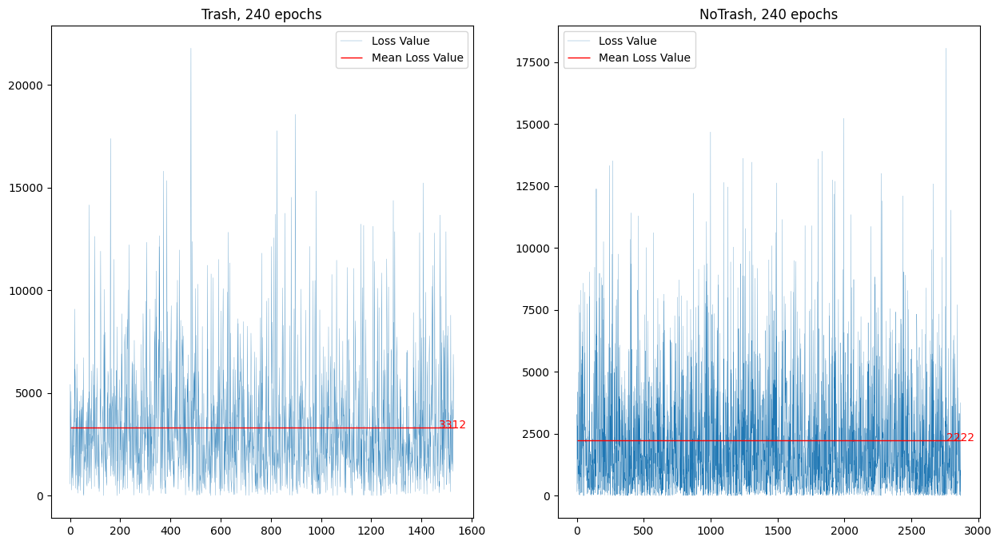

Mean of trash losses 3337.4998
Mean of No trash losses 2249.668
Diff of means 1087.8318


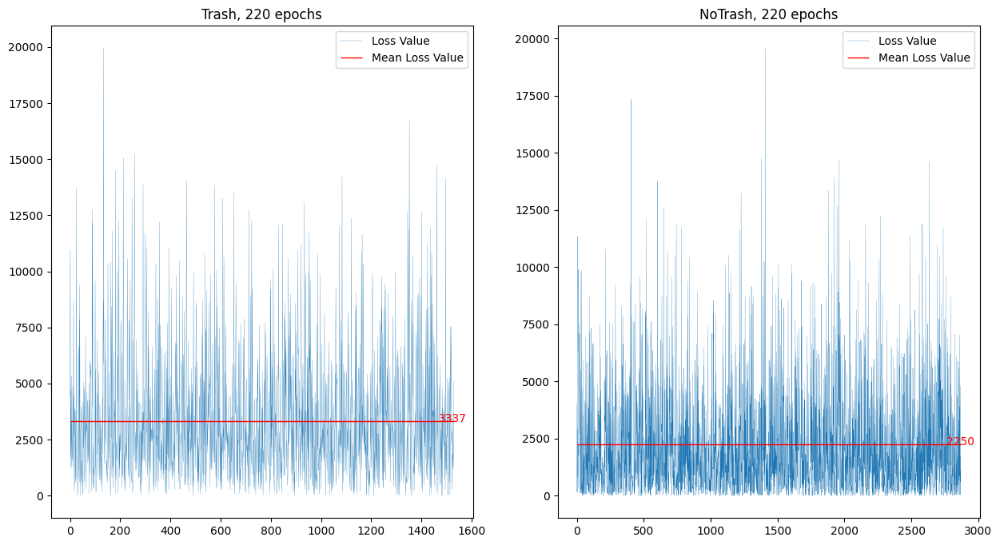

Mean of trash losses 3267.2937
Mean of No trash losses 2260.3037
Diff of means 1006.99


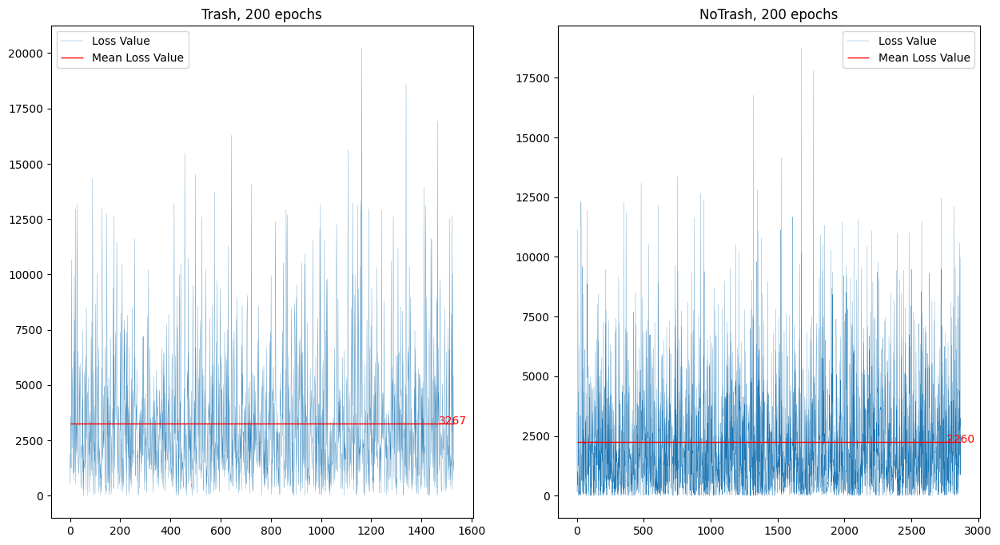

Mean of trash losses 3510.777
Mean of No trash losses 2411.3867
Diff of means 1099.3904


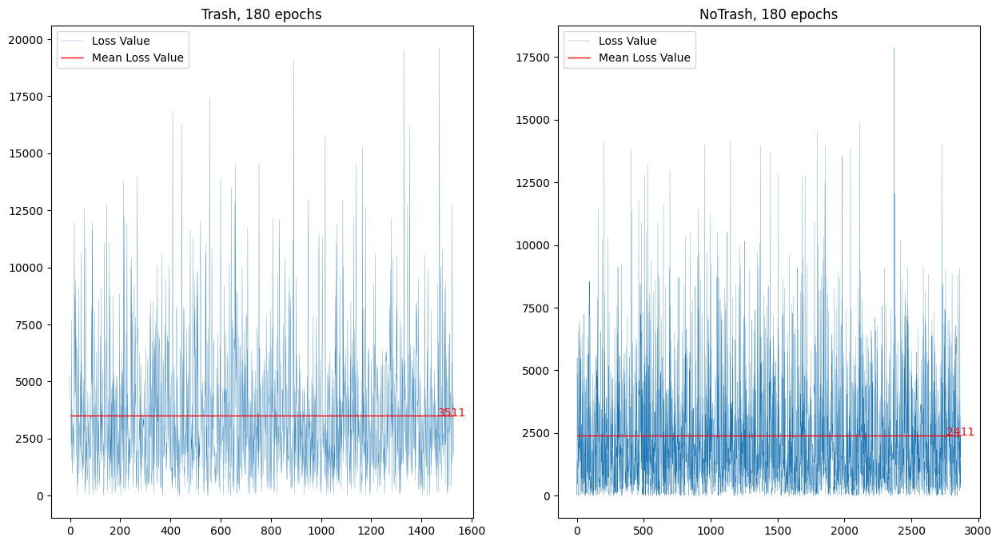

Mean of trash losses 3321.4287
Mean of No trash losses 2284.1665
Diff of means 1037.2622


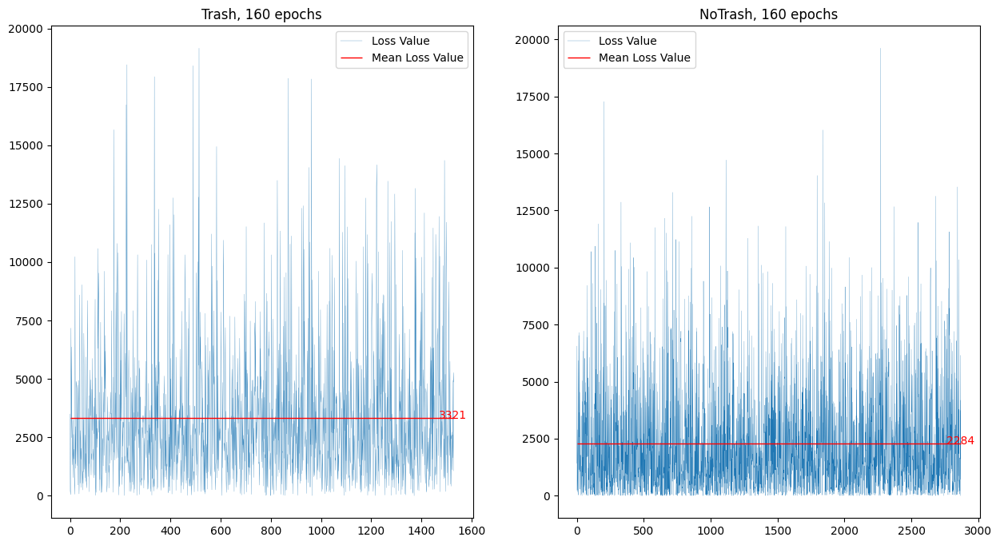

Mean of trash losses 3460.9402
Mean of No trash losses 2350.1028
Diff of means 1110.8374


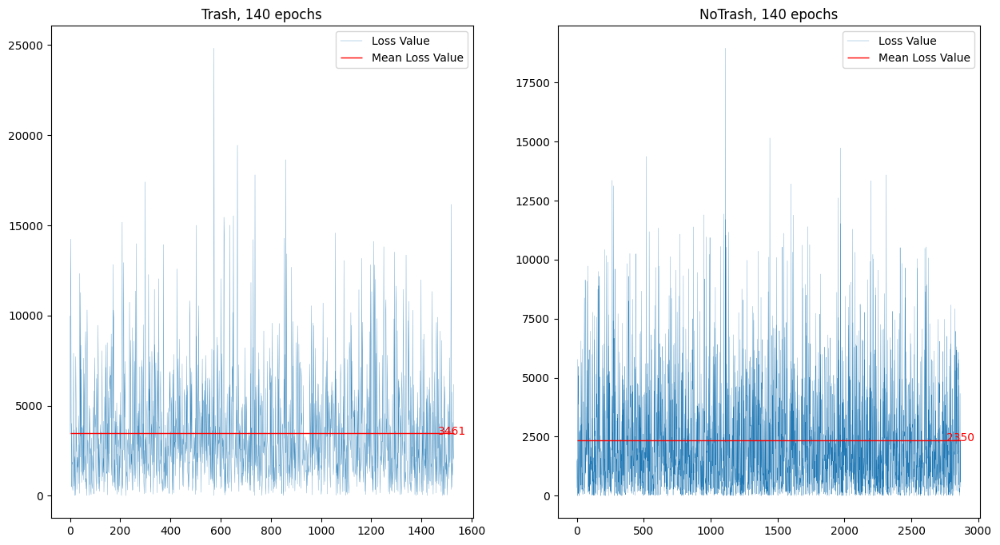

Mean of trash losses 3333.839
Mean of No trash losses 2320.868
Diff of means 1012.9712


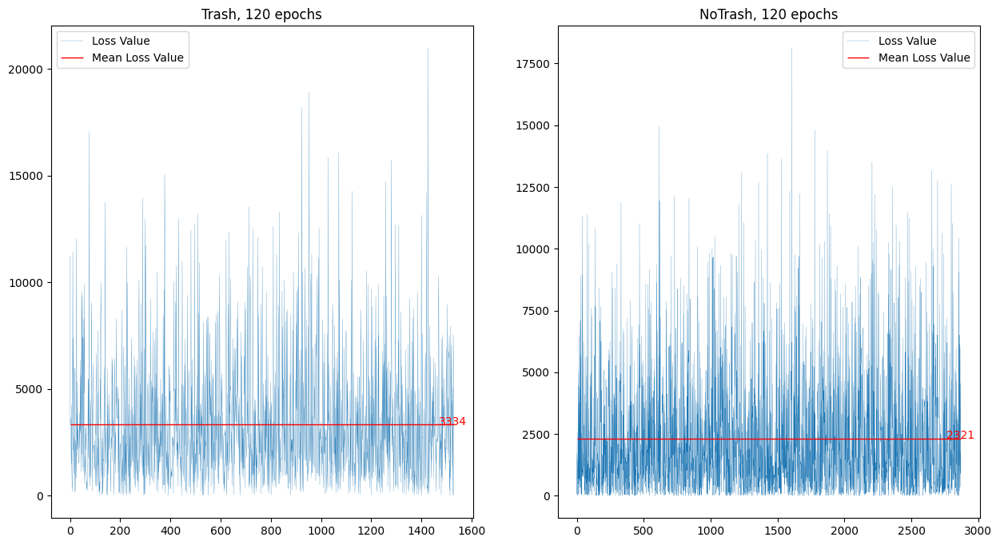

Mean of trash losses 3883.5657
Mean of No trash losses 2793.869
Diff of means 1089.6968


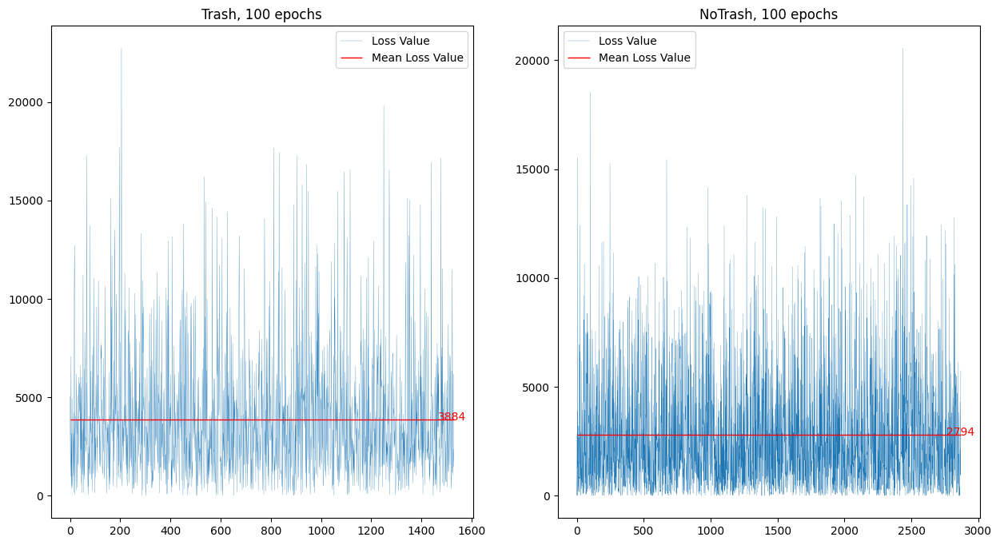

Mean of trash losses 3751.159
Mean of No trash losses 2702.923
Diff of means 1048.2358


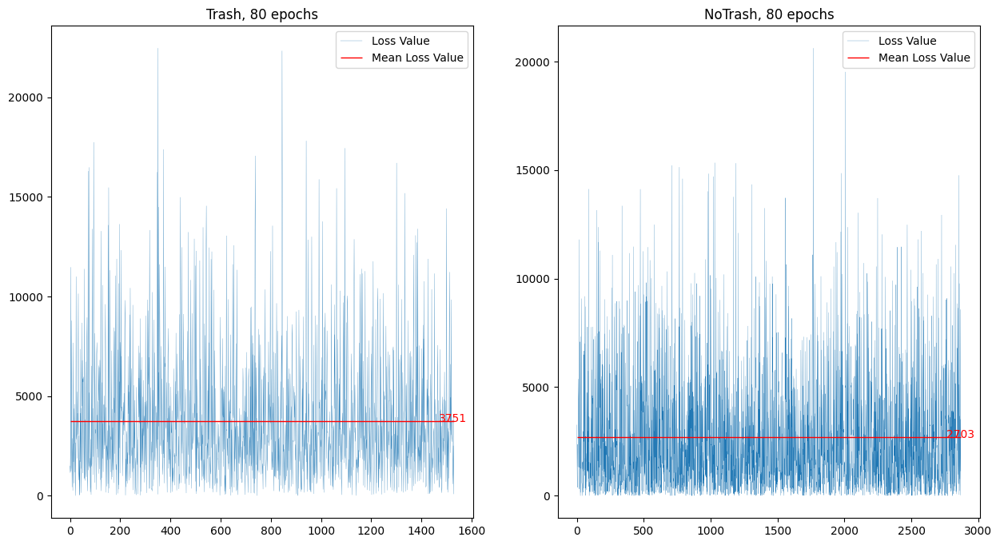

Mean of trash losses 3661.4858
Mean of No trash losses 2675.2417
Diff of means 986.24414


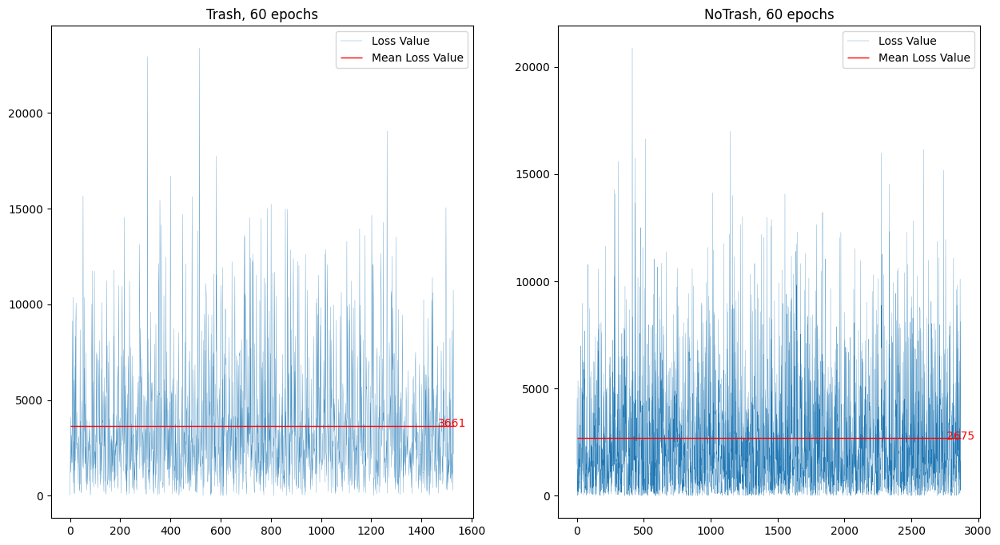

Mean of trash losses 3751.1702
Mean of No trash losses 2826.9143
Diff of means 924.25586


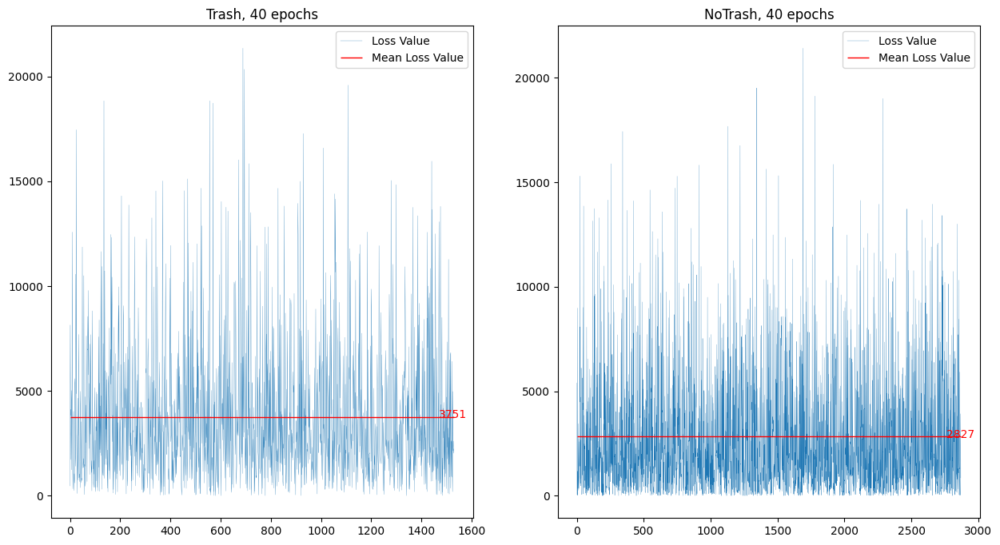

Mean of trash losses 3968.441
Mean of No trash losses 3089.7993
Diff of means 878.6416


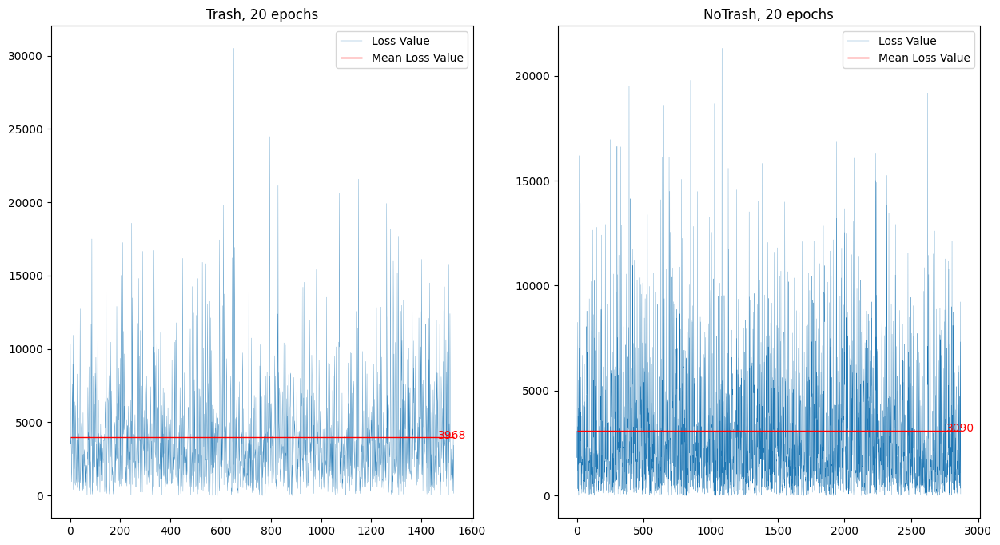

In [36]:
for epoch, diffs in  all_diffs_1.items():

    diffs_trash = diffs["trash"]
    diffs_notrash = diffs["notrash"]

    len_diffs_trash = len(diffs_trash)
    len_diffs_notrash = len(diffs_notrash)

    mean_loss_trash = np.mean(diffs_trash)
    mean_loss_no_trash = np.mean(diffs_notrash)



    print("Mean of trash losses", mean_loss_trash)
    print("Mean of No trash losses", mean_loss_no_trash)
    print("Diff of means", np.abs(mean_loss_no_trash - mean_loss_trash))
    
    fig, axes = plt.subplots(1,2, figsize=(15,8))
    trans = transforms.blended_transform_factory(axes[0].get_yticklabels()[0].get_transform(), axes[0].transData)
    axes[0].plot(range(len_diffs_trash), diffs_trash, linewidth=.2, label="Loss Value")
    axes[0].set_title(f"Trash, {epoch} epochs")
    axes[0].hlines(y=mean_loss_trash, xmin=0, xmax=len_diffs_trash, linewidth=1, color='r', label="Mean Loss Value")
    axes[0].text(len_diffs_trash+50,mean_loss_trash+110, "{:.0f}".format(mean_loss_trash), color="red", ha="right", va="center")
    axes[0].legend()
    axes[1].plot(range(len_diffs_notrash), diffs_notrash,linewidth=.2, label="Loss Value")
    axes[1].set_title(f"NoTrash, {epoch} epochs")
    axes[1].hlines(y=mean_loss_no_trash, xmin=0, xmax=len_diffs_notrash, linewidth=1, color='r', label="Mean Loss Value")
    axes[1].text(len_diffs_notrash+100,mean_loss_no_trash+110, "{:.0f}".format(mean_loss_no_trash), color="red", ha="right", va="center")
    axes[1].legend()
    plt.show()

In [67]:
def balanced_accuracy(tp,tn,fp,fn):
    return (0.5*(tp/(tp+fn))) + (0.5*(tn/(tn+fp)))

def calculate_metrics(all_actual_predictions:dict):
    all_balanced_accuracy = {}
    for epoch, (act, pred) in all_actual_predictions.items():
        true_pos, true_neg, false_pos, false_neg = 0, 0, 1, 1
        for i in range(len(act)):
            if pred[i] == act[i] == "trash": 
                true_pos+=1
            elif pred[i] == act[i] == "notrash":
                true_neg +=1
            elif pred[i] == "trash" and act[i] =="notrash":
                false_pos +=1
            elif pred[i] == "notrash" and act[i] == "trash":
                false_neg +=1
        
        all_balanced_accuracy[epoch] = (balanced_accuracy(true_pos, true_neg, false_pos, false_neg), true_pos, true_neg, false_pos, false_neg)
    return all_balanced_accuracy

In [63]:
balanced_acc_1 = calculate_metrics(all_actual_predictions_1)
balanced_acc_1

{240: (0.6025107604017217, 810, 1939, 931, 720),
 220: (0.5956491539705313, 797, 1924, 946, 733),
 200: (0.5886554621848739, 774, 1927, 943, 756),
 180: (0.6002960533807018, 856, 1840, 1030, 674),
 160: (0.5950604632096741, 792, 1930, 940, 738),
 140: (0.5966113274578124, 825, 1877, 993, 705),
 120: (0.5799230261210175, 775, 1875, 995, 755),
 100: (0.592530345471522, 917, 1681, 1189, 613),
 80: (0.5762975108742684, 854, 1706, 1164, 676),
 60: (0.5838092960761541, 845, 1766, 1104, 685),
 40: (0.5766231695930405, 847, 1721, 1149, 683),
 20: (0.5717041288059939, 865, 1659, 1211, 665)}

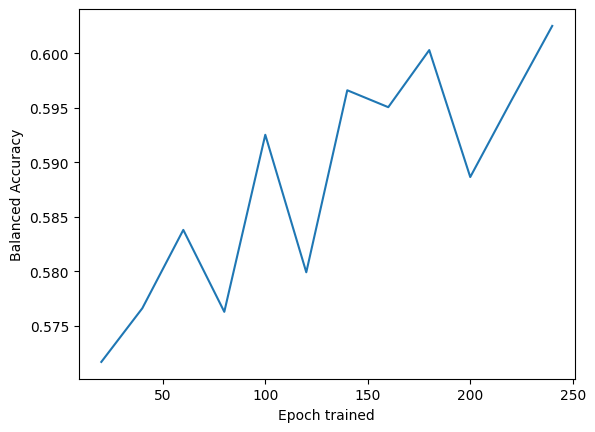

In [64]:
plt.plot(balanced_acc_1.keys(), [val[0] for val in balanced_acc_1.values()])
plt.xlabel("Epoch trained")
plt.ylabel("Balanced Accuracy")
plt.show()

#### with 0.4 ignorance threshold

In [53]:
all_diffs_2,all_actual_predictions_2 = evaluate(test_dataset_loaded, 0.4, opt)


loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_240.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_240.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------


loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_220.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_200.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_200.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_180.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_180.pth
---------- Networks initialized --------

In [65]:
balanced_acc_2 = calculate_metrics(all_actual_predictions_2)
balanced_acc_2

{240: (0.5560463209674114, 405, 2432, 438, 1125),
 220: (0.55121154152718, 403, 2408, 462, 1127),
 200: (0.5528443897884358, 400, 2423, 447, 1130),
 180: (0.5641570449317939, 473, 2351, 519, 1057),
 160: (0.5528022591150281, 410, 2404, 466, 1120),
 140: (0.5531096991642186, 428, 2372, 498, 1102),
 120: (0.5419109107057457, 390, 2379, 491, 1140),
 100: (0.5588542734166837, 549, 2178, 692, 981),
 80: (0.5485664184372936, 485, 2239, 631, 1045),
 60: (0.5441643323996265, 463, 2255, 615, 1067),
 40: (0.5419234360410832, 478, 2214, 656, 1052),
 20: (0.5410375532326752, 527, 2117, 753, 1003)}

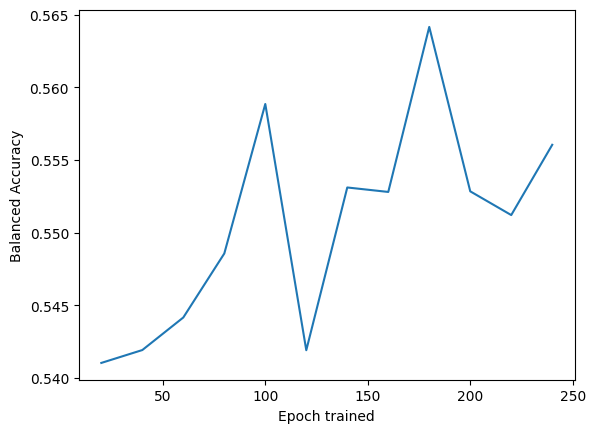

In [66]:
plt.plot(balanced_acc_2.keys(), [val[0] for val in balanced_acc_2.values()])
plt.xlabel("Epoch trained")
plt.ylabel("Balanced Accuracy")
plt.show()

#### Accuracy for train dataset

In [60]:
all_diffs_train_1,all_actual_predictions_train_1 = evaluate(dataset_loaded, 0.2, opt)


loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_240.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_240.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------


loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_220.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_220.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_200.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_200.pth
---------- Networks initialized -------------
[Network encoder] Total number of parameters : 11.814 M
[Network decoder] Total number of parameters : 12.820 M
[Network discriminator] Total number of parameters : 0.010 M
-----------------------------------------------
loading the encoder from vae_v2_saved_models/aae/notrash/aae_e_180.pth
loading the decoder from vae_v2_saved_models/aae/notrash/aae_d_180.pth
---------- Networks initialized --------

In [68]:
balanced_acc_train_1 = calculate_metrics(all_actual_predictions_train_1)
balanced_acc_train_1

{240: (0.42983801079928, 0, 12896, 2105, 1),
 220: (0.42843810412639155, 0, 12854, 2147, 1),
 200: (0.4284047730151323, 0, 12853, 2148, 1),
 180: (0.4166388907406173, 0, 12500, 2501, 1),
 160: (0.41843877074861674, 0, 12554, 2447, 1),
 140: (0.40893940403973067, 0, 12269, 2732, 1),
 120: (0.4058396106926205, 0, 12176, 2825, 1),
 100: (0.37117525498300113, 0, 11136, 3865, 1),
 80: (0.364742350509966, 0, 10943, 4058, 1),
 60: (0.3479101393240451, 0, 10438, 4563, 1),
 40: (0.3007132857809479, 0, 9022, 5979, 1),
 20: (0.2307512832477835, 0, 6923, 8078, 1)}

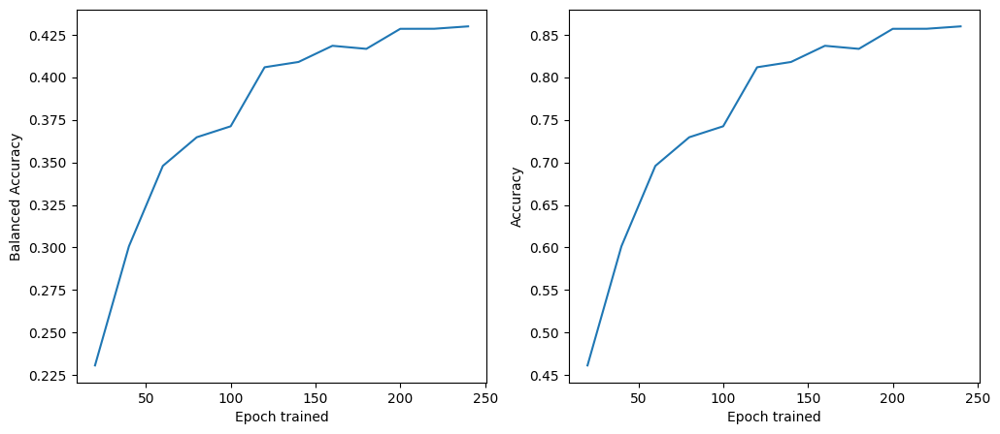

In [72]:
fig, axes = plt.subplots(1,2, figsize=(12,5))
axes[0].plot(balanced_acc_train_1.keys(),[val[0] for val in balanced_acc_train_1.values()])
axes[0].set_xlabel("Epoch trained")
axes[0].set_ylabel("Balanced Accuracy")

axes[1].plot(balanced_acc_train_1.keys(),[val[2]/(val[2]+val[3]) for val in balanced_acc_train_1.values()])
axes[1].set_xlabel("Epoch trained")
axes[1].set_ylabel("Accuracy")
plt.show()